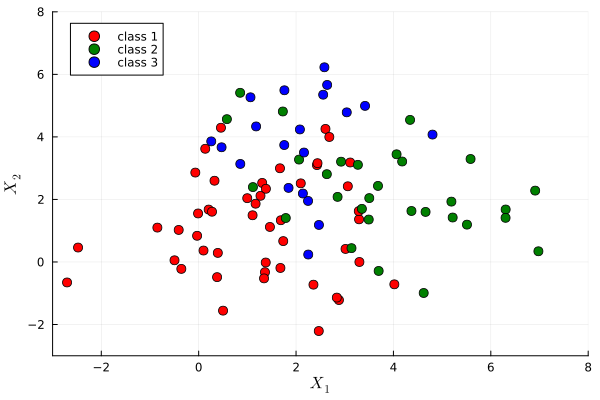

In [1]:
using Distributions, Random, LaTeXStrings, Plots
Random.seed!(1)

d, k = 2, 3 #d features and k label types

function make_data(class1 = 50, class2 = 30, class3 = 20)
    return (#X
            vcat(   rand(MvNormal([1,1],[3 0.7; 0.7 3]), class1)', 
                    rand(MvNormal([4,2],[2.5 -0.7; -0.7 2.5]), class2)', 
                    rand(MvNormal([2,4],[2 0.7; 0.7 2]), class3)')
            ,
            #y
            vcat(fill(1,class1), fill(2,class2), fill(3,class3))
            )
end

X, y = make_data()
n = length(y)
label_colors = [:red :green :blue]
xlim, ylim = (-3,8),(-3,8)

#We'll plot points again below, so putting it in in a function
function plot_points(plt_function, X, y)
    plt_function(X[:,1], X[:,2], c = label_colors, ms = 5,
        group = y, label=hcat(["class $k" for k in 1:3]...), xlabel = L"X_1", ylabel = L"X_2",
        xlim = xlim, ylim = ylim, legend = :topleft
    )
end

plot_points(scatter, X, y)

In [2]:
abstract type AbstractDecisionNode end

mutable struct DecisionNode <: AbstractDecisionNode
    # Cutoff logic
    feature::Int
    cutoff::Float64

    # Children - either another decision node or an value (label)
    lchild::Union{DecisionNode, Int64}
    rchild::Union{DecisionNode, Int64}
end

In [3]:
function Base.show(io::IO, node::AbstractDecisionNode, this_prefix = "", subtree_prefix = "")
    println(io, "$(this_prefix)─┬ feature[$(node.feature)] < $(node.cutoff)")

    # print children
    if node.lchild isa AbstractDecisionNode
        show(io, node.lchild, "$(subtree_prefix) ├", "$(subtree_prefix) │")
    else
        println(io, "$(subtree_prefix) ├── $(node.lchild)")
    end

    if node.rchild isa AbstractDecisionNode
        show(io, node.rchild, "$(subtree_prefix) └", "$(subtree_prefix)  ")
    else
        println(io, "$(subtree_prefix) └── $(node.rchild)")
    end
end

In [4]:
manual_tree = DecisionNode(
    1,   # 1st feature
    2.0, # Cutoff 2.0
    1,   # Left child is `1`
    2,   # Right child is `2`
)

─┬ feature[1] < 2.0
 ├── 1
 └── 2


In [5]:
# Prediction on a node uses the cutoff
function predict(node::AbstractDecisionNode, features::Vector{Float64})
    if features[node.feature] <= node.cutoff
        return predict(node.lchild, features)
    else
        return predict(node.rchild, features)
    end
end;

# This stops when the node lchild or rchild is a value (Int64) and then prediction
predict(leaf::Int64, ::Vector{Float64}) = leaf;

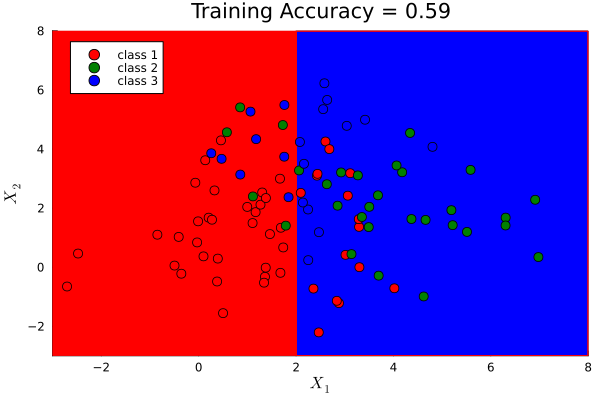

In [6]:
function tree_accuracy(tree, X, y)
    return mean(predict(tree, X[i,:]) == y[i] for i in 1:size(X)[1])
end

x1_grid = xlim[1]:0.005:xlim[2]
x2_grid = ylim[1]:0.005:ylim[2]
ccol = cgrad([RGB(1,0,0), RGB(0,1,0), RGB(0,0,1)])

function plot_decision(tree, X, y)
    contour(x1_grid, x2_grid, (x1, x2) -> predict(tree, [x1, x2]), 
            f = true, nlev = 3, c = ccol, legend = :none,
            title = "Training Accuracy = $(tree_accuracy(tree, X, y))")
    plot_points(scatter!, X, y)
end

plot_decision(manual_tree, X, y)

In [7]:
#Split the right child
manual_tree.rchild = DecisionNode(
    2,
    4.0,
    2,
    3
)

manual_tree

─┬ feature[1] < 2.0
 ├── 1
 └─┬ feature[2] < 4.0
   ├── 2
   └── 3


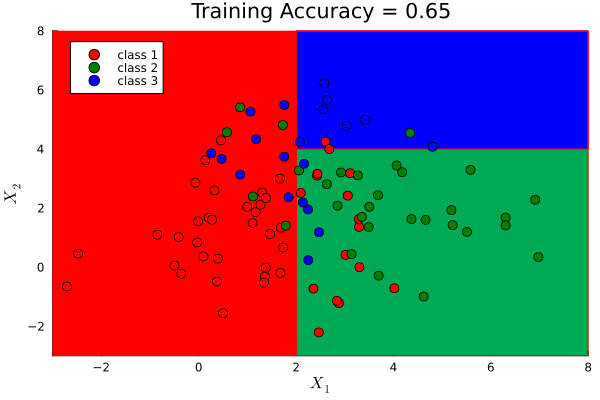

In [8]:
plot_decision(manual_tree, X, y)

In [9]:
#split the left child
manual_tree.lchild = DecisionNode(
    2,
    1.9,
    1,
    3
)
manual_tree

─┬ feature[1] < 2.0
 ├─┬ feature[2] < 1.9
 │ ├── 1
 │ └── 3
 └─┬ feature[2] < 4.0
   ├── 2
   └── 3


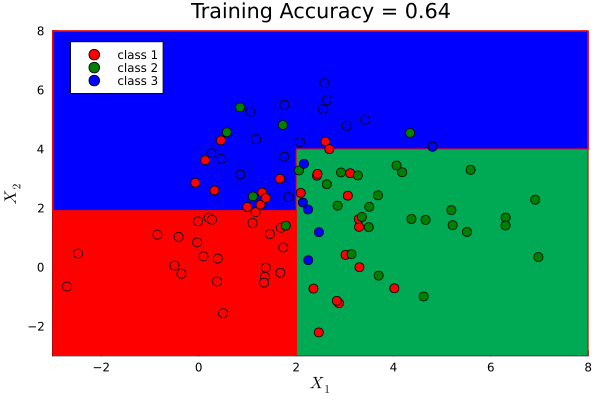

In [10]:
plot_decision(manual_tree, X, y)

In [11]:
#This is meant for leafs
mutable struct DecisionWithData
    # The data available to the leaf
    X::Matrix{Float64}
    y::Vector{Int}

    # The current class of the leaf.
    value::Int64
end

#This is meant for nodes that are NOT leafs
mutable struct DecisionNodeWithData <: AbstractDecisionNode
    # The data available to the node
    X::Matrix{Float64}
    y::Vector{Int64}

    # Cutoff logic
    feature::Int64
    cutoff::Float64

    # Children - either another decision node
    lchild::Union{DecisionNodeWithData, DecisionWithData}
    rchild::Union{DecisionNodeWithData, DecisionWithData}
end

Base.show(io::IO, leaf::DecisionWithData) = Base.show(io, leaf.value)
predict(leaf::DecisionWithData, ::Vector{Float64}) = leaf.value

predict (generic function with 3 methods)

In [12]:
# make an empty tree
initial_tree(X, y) = DecisionWithData(X, y, 1); 
auto_split_tree = initial_tree(X, y)

1

In [13]:
using StatsBase: mode #used here for finding the most common label 

function find_splitting_rule(leaf::DecisionWithData)
    X, y = leaf.X, leaf.y
    n, d = size(X)

    loss, τ, feature = Inf, NaN, -1
    pred_left_choice, pred_right_choice = -1, -1
    final_left_bits = BitVector()

    #Loop over all features
    for j = 1:d
        #Loop over all observations
        for i in 1:n
            τ_candidate = X[i,j]
            left_bits = X[:,j] .≤ τ_candidate
            right_bits = .!left_bits
            pred_left, pred_right = 0, 0

            (sum(left_bits) == 0 || sum(left_bits) == n) && continue

            pred_left = mode(y[left_bits])
            pred_right = mode(y[right_bits]) 
            new_loss = mean(y[left_bits] .!= pred_left) + mean(y[right_bits] .!= pred_right)

            #if found a better split than previously then retain it
            if new_loss < loss
                final_left_bits = left_bits
                pred_left_choice = pred_left
                pred_right_choice = pred_right
                feature = j
                τ = τ_candidate
                loss = new_loss
            end
        end
    end

    return (
        feature = feature,
        cutoff = τ, 
        left_value = pred_left_choice, 
        right_value = pred_right_choice, 
        left_bits = final_left_bits
    )
end;

In [14]:
function build_tree(leaf::DecisionWithData; max_depth = Inf, depth = 0)
    length(leaf.y) == 1 && return leaf
    length(unique(leaf.y)) ≤ 1 && return leaf
    (depth ≥ max_depth) && return leaf

    splitting_result = find_splitting_rule(leaf)
    right_bits = .!splitting_result.left_bits #.! flips the bits

    lchild = build_tree(
        DecisionWithData(
            leaf.X[splitting_result.left_bits,:], 
            leaf.y[splitting_result.left_bits], 
            splitting_result.left_value,
        ); max_depth = max_depth, depth = depth + 1
    )

    rchild =  build_tree(
        DecisionWithData(
            leaf.X[right_bits,:], 
            leaf.y[right_bits],  
            splitting_result.right_value,
        ); max_depth = max_depth, depth = depth + 1
    )

    return DecisionNodeWithData(
        leaf.X,
        leaf.y,
        splitting_result.feature,
        splitting_result.cutoff,
        lchild,
        rchild
    )
end;

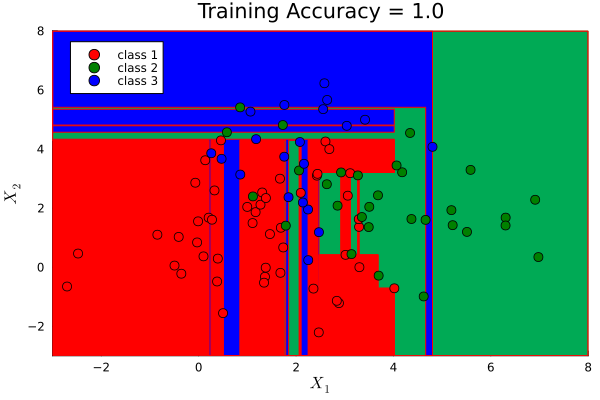

In [15]:
auto_split_tree = build_tree(initial_tree(X, y))
plot_decision(auto_split_tree, X, y)

In [16]:
num_nodes(leaf::DecisionWithData) = 1
function num_nodes(node::DecisionNodeWithData)
    return 1 + num_nodes(node.lchild) + num_nodes(node.rchild)
end
num_nodes(auto_split_tree)

149

In [17]:
depth(leaf::DecisionWithData) = 1
function depth(node::DecisionNodeWithData; max_depth = 1)
    return 1 + max(depth(node.lchild), depth(node.rchild))
end
depth(auto_split_tree)


75

In [18]:
for d = 2:100
    tree = build_tree(initial_tree(X, y), max_depth = d)
    tree_summary = (
        max_depth = d, 
        actual_depth = depth(tree), 
        num_nodes = num_nodes(tree), 
        accuracy = tree_accuracy(tree, X, y)
    )
    println(tree_summary)
end

(max_depth = 2, actual_depth = 3, num_nodes = 5, accuracy = 0.61)
(max_depth = 3, actual_depth = 4, num_nodes = 7, accuracy = 0.62)
(max_depth = 4, actual_depth = 5, num_nodes = 9, accuracy = 0.68)
(max_depth = 5, actual_depth = 6, num_nodes = 11, accuracy = 0.69)
(max_depth = 6, actual_depth = 7, num_nodes = 13, accuracy = 0.72)
(max_depth = 7, actual_depth = 8, num_nodes = 15, accuracy = 0.73)
(max_depth = 8, actual_depth = 9, num_nodes = 17, accuracy = 0.74)
(max_depth = 9, actual_depth = 10, num_nodes = 19, accuracy = 0.75)
(max_depth = 10, actual_depth = 11, num_nodes = 21, accuracy = 0.76)
(max_depth = 11, actual_depth = 12, num_nodes = 23, accuracy = 0.76)
(max_depth = 12, actual_depth = 13, num_nodes = 25, accuracy = 0.76)
(max_depth = 13, actual_depth = 14, num_nodes = 27, accuracy = 0.76)
(max_depth = 14, actual_depth = 15, num_nodes = 29, accuracy = 0.76)
(max_depth = 15, actual_depth = 16, num_nodes = 31, accuracy = 0.76)
(max_depth = 16, actual_depth = 17, num_nodes = 33, 

In [20]:
using MLDatasets
train_data = MLDatasets.MNIST.traindata(Float64)

train_imgs = train_data[1]
@show typeof(train_imgs)
@show size(train_imgs)

train_labels = train_data[2]
@show typeof(train_labels);

┌ Warning: MNIST.traindata() is deprecated, use `MNIST(split=:train)[:]` instead.
└ @ MLDatasets ~/.julia/packages/MLDatasets/mtOdX/src/datasets/vision/mnist.jl:187


typeof(train_imgs) = Array{Float64, 3}
size(train_imgs) = (28, 28, 60000)
typeof(train_labels) = Vector{Int64}


In [23]:
test_data = MLDatasets.MNIST.testdata(Float64)
test_imgs = test_data[1]
test_labels = test_data[2]
@show size(test_imgs);

┌ Warning: MNIST.testdata() is deprecated, use `MNIST(split=:test)[:]` instead.
└ @ MLDatasets ~/.julia/packages/MLDatasets/mtOdX/src/datasets/vision/mnist.jl:195


size(test_imgs) = (28, 28, 10000)


In [24]:
y_train = train_labels
y_test = test_labels

X_train = vcat([vec(train_imgs[:,:,k])' for k in 1:n_train]...)
X_test = vcat([vec(test_imgs[:,:,k])' for k in 1:n_test]...);

size(X_train), size(X_test)

LoadError: UndefVarError: `n_train` not defined

In [25]:
n_train, n_test = length(train_labels), length(test_labels)


(60000, 10000)

In [26]:
using Flux, Statistics, Random, StatsBase, Plots
using Flux: params, onehotbatch, crossentropy, update!
Random.seed!(0)

X_test = vcat([vec(test_imgs[:,:,k])' for k in 1:n_test]...)

logistic_softmax_predict(img_vec, W, b) = softmax(W*img_vec .+ b)
logistic_sofmax_classifier(img_vec, W, b) = argmax(logistic_softmax_predict(img_vec, W, b)) - 1


function train_softmax_logistic(;mini_batch_size = 1000)
    
    #Initilize parameters
    W = randn(10,28*28)
    b = randn(10)

    opt = ADAM(0.01)
    loss(x, y) = crossentropy(logistic_softmax_predict(x, W, b), onehotbatch(y,0:9))

    loss_value = 0.0
    epoch_num = 0

    #Training loop
    while true
        prev_loss_value = loss_value
        
        #Loop over mini-batches in epoch
        start_time = time_ns()
        for batch in Iterators.partition(1:n_train, mini_batch_size)
            gs = gradient(()->loss(X'[:,batch], train_labels[batch]), params(W,b))
            for p in (W,b)
                update!(opt, p, gs[p])
            end
        end
        end_time = time_ns()

        #record/display progress
        epoch_num += 1
        loss_value = loss(X', train_labels)
        println("Epoch = $epoch_num ($(round((end_time-start_time)/1e9,digits=2)) sec) Loss = $loss_value")
        
        if epoch_num == 1 || epoch_num % 5 == 0 
            acc = mean([logistic_sofmax_classifier(X_test'[:,k], W, b) for k in 1:n_test] .== test_labels)
            println("\tValidation accuracy: $acc") 
            
            #Stopping criteria
            abs(prev_loss_value-loss_value) < 1e-3 && break
        end
    end
    return W, b
end

# Train model parameters
W, b = train_softmax_logistic();

LoadError: BoundsError: attempt to access 2×100 adjoint(::Matrix{Float64}) with eltype Float64 at index [1:2, 1:1000]